<a href="https://colab.research.google.com/github/cindyy-chen/iss_movement/blob/main/dec1_flags_on_colorcoded_map_Copy_of_Oct_2024_Copy_of_google_colab_manipulating_ISS_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analysis of the ISS Movement

## <font color="red">Required packages</font>

- country_converter
- Matplotlib
- NumPy
- Pandas
- Cartopy (might not be needed at the end)
- Shapely
- GeoPandas
- MovingPandas
- HoloViews
- hvplot

<font color="red">If using Google Colab, uncommment the line below</font>

In [1]:
!pip install country_converter
!pip install shapely
!pip install cartopy
!pip install geopandas
!pip install movingpandas
!pip install hvplot
!pip install holoviews
!pip install geoviews

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.2/47.2 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.9/161.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.3/547.3 kB 9.1 MB/s eta 0:00:00


---

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import os
from pathlib import Path
import datetime as dt

In [4]:
import country_converter as coco

In [5]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.cm as mcm

In [6]:
import cartopy
import cartopy.crs as ccrs

In [7]:
from shapely import geometry as shpgeom
from shapely import wkt as shpwkt

In [8]:
import numpy as np
import pandas as pd
import geopandas as gpd
import movingpandas as mpd

In [9]:
import holoviews as hv
import hvplot.pandas
import geoviews

In [10]:
#plot_defaults = {'linewidth':5, 'capstyle':'round', 'figsize':(9,3), 'legend':True}
hv.opts.defaults(hv.opts.Overlay(active_tools=['wheel_zoom'],
                                 frame_width=620, frame_height=400))
hvplot_defaults = {'tiles':None, 'cmap':'Viridis', 'colorbar':True}

In [11]:
mpd.show_versions()


MovingPandas 0.21.2

SYSTEM INFO
-----------
python     : 3.11.11 (main, Dec  4 2024, 08:55:07) [GCC 11.4.0]
executable : /usr/bin/python3
machine    : Linux-6.1.85+-x86_64-with-glibc2.35

PROJ INFO
-----------
PROJ       : 9.5.1
PROJ data dir: /usr/local/lib/python3.11/dist-packages/pyproj/proj_dir/share/proj

PYTHON DEPENDENCIES
-------------------
numpy      : 2.0.2
geopandas  : 1.0.1
geopy      : 2.4.1
geoviews   : 1.14.0
holoviews  : 1.20.2
hvplot     : 0.11.2
mapclassify: None
matplotlib : 3.10.0
pandas     : 2.2.2
pyproj     : 3.7.1
shapely    : 2.0.7
stonesoup  : None


## Step 1: <font color="red">Read the CSV File</font>

In [12]:
file_name = "https://raw.githubusercontent.com/cindyy-chen/iss_movement/main/iss_timeseries_trajectories_20240303_104539.csv"

In [13]:
df = pd.read_csv(file_name)

In [14]:
def set_ocean(row):
    if row["land_flag"]:
        name=row["country"]

    else:
        name="ocean"
    return name

In [15]:
df["country"]=df.apply(set_ocean, axis=1)
df

,t,latitude,longitude,land_flag,temperature,windspeed,traj_id,country
0,2024-03-03 10:45:39,-36.9477,-63.3776,True,22.4,5.7,0,Argentina
1,2024-03-03 10:45:45,-37.1914,-63.0247,True,21.7,3.1,0,Argentina
2,2024-03-03 10:45:52,-37.4542,-62.6395,True,21.1,3.7,0,Argentina
3,2024-03-03 10:45:58,-37.6752,-62.3114,True,19.9,10.2,0,Argentina
4,2024-03-03 10:46:03,-37.8953,-61.9813,True,20.8,11.7,0,Argentina
...,...,...,...,...,...,...,...,...
3996,2024-03-03 17:00:09,-43.6702,-145.9861,False,17.0,39.9,4,ocean
3997,2024-03-03 17:00:14,-43.8520,-145.5860,False,16.8,40.4,4,ocean
3998,2024-03-03 17:00:20,-44.0321,-145.1835,False,16.5,43.6,4,ocean
3999,2024-03-03 17:00:26,-44.2268,-144.7414,False,16.2,44.1,4,ocean


In [16]:
# only using first orbit

first_idx = 653 #the index of the first entry of the first full orbit
last_idx = first_idx + 1051 #the index of the last entry of the first full orbit

df = df.iloc[first_idx:last_idx]
df

,t,latitude,longitude,land_flag,temperature,windspeed,traj_id,country
653,2024-03-03 11:46:39,48.7047,-179.8172,False,2.8,44.7,1,ocean
654,2024-03-03 11:46:45,48.5716,-179.2900,False,3.2,41.4,1,ocean
655,2024-03-03 11:46:51,48.4473,-178.8094,False,3.7,35.7,1,ocean
656,2024-03-03 11:46:56,48.3208,-178.3313,False,3.7,35.5,1,ocean
657,2024-03-03 11:47:02,48.1921,-177.8557,False,3.5,36.0,1,ocean
...,...,...,...,...,...,...,...,...
1699,2024-03-03 13:24:20,39.8013,178.4454,False,13.2,13.4,1,ocean
1700,2024-03-03 13:24:26,39.5908,178.7957,False,13.6,14.9,1,ocean
1701,2024-03-03 13:24:31,39.3793,179.1435,False,13.9,14.9,1,ocean
1702,2024-03-03 13:24:37,39.1665,179.4892,False,14.3,17.9,1,ocean


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 653 to 1703
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   t            1051 non-null   object 
 1   latitude     1051 non-null   float64
 2   longitude    1051 non-null   float64
 3   land_flag    1051 non-null   bool   
 4   temperature  1051 non-null   float64
 5   windspeed    1051 non-null   float64
 6   traj_id      1051 non-null   int64  
 7   country      1051 non-null   object 
dtypes: bool(1), float64(4), int64(1), object(2)
memory usage: 58.6+ KB


Note that the column `t` has string as data type. We want it to be a datetime object.

## Step 2: <font color="red">Perform Conversions</font>

#### Convert the `t` column into a datetime object

In [18]:
df['t'] = pd.to_datetime(df['t'], format='%Y-%m-%d %H:%M:%S')

Make the `t` column as index

In [19]:
#df.set_index('t', inplace=True)

In [20]:
df.head(4)

,t,latitude,longitude,land_flag,temperature,windspeed,traj_id,country
653,2024-03-03 11:46:39,48.7047,-179.8172,False,2.8,44.7,1,ocean
654,2024-03-03 11:46:45,48.5716,-179.2900,False,3.2,41.4,1,ocean
655,2024-03-03 11:46:51,48.4473,-178.8094,False,3.7,35.7,1,ocean
656,2024-03-03 11:46:56,48.3208,-178.3313,False,3.7,35.5,1,ocean


#### Count the number of locations that are on land:
- `land_flag` is `True` for land and `False` otherwise (ocean).

In [21]:
df.land_flag.sum()

np.int64(283)

#### Convert the positions (latitude and longitude) into `Shapely` POINT objects:
- Add a `geometry` column

In [22]:
df['geometry'] = [shpgeom.Point(xy) for xy in zip(df['longitude'], df['latitude'])]
df

,t,latitude,longitude,land_flag,temperature,windspeed,traj_id,country,geometry
653,2024-03-03 11:46:39,48.7047,-179.8172,False,2.8,44.7,1,ocean,POINT (-179.8172 48.7047)
654,2024-03-03 11:46:45,48.5716,-179.2900,False,3.2,41.4,1,ocean,POINT (-179.29 48.5716)
655,2024-03-03 11:46:51,48.4473,-178.8094,False,3.7,35.7,1,ocean,POINT (-178.8094 48.4473)
656,2024-03-03 11:46:56,48.3208,-178.3313,False,3.7,35.5,1,ocean,POINT (-178.3313 48.3208)
657,2024-03-03 11:47:02,48.1921,-177.8557,False,3.5,36.0,1,ocean,POINT (-177.8557 48.1921)
...,...,...,...,...,...,...,...,...,...
1699,2024-03-03 13:24:20,39.8013,178.4454,False,13.2,13.4,1,ocean,POINT (178.4454 39.8013)
1700,2024-03-03 13:24:26,39.5908,178.7957,False,13.6,14.9,1,ocean,POINT (178.7957 39.5908)
1701,2024-03-03 13:24:31,39.3793,179.1435,False,13.9,14.9,1,ocean,POINT (179.1435 39.3793)
1702,2024-03-03 13:24:37,39.1665,179.4892,False,14.3,17.9,1,ocean,POINT (179.4892 39.1665)


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 653 to 1703
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   t            1051 non-null   datetime64[ns]
 1   latitude     1051 non-null   float64       
 2   longitude    1051 non-null   float64       
 3   land_flag    1051 non-null   bool          
 4   temperature  1051 non-null   float64       
 5   windspeed    1051 non-null   float64       
 6   traj_id      1051 non-null   int64         
 7   country      1051 non-null   object        
 8   geometry     1051 non-null   object        
dtypes: bool(1), datetime64[ns](1), float64(4), int64(1), object(2)
memory usage: 66.8+ KB


In [24]:
df.head(4)

,t,latitude,longitude,land_flag,temperature,windspeed,traj_id,country,geometry
653,2024-03-03 11:46:39,48.7047,-179.8172,False,2.8,44.7,1,ocean,POINT (-179.8172 48.7047)
654,2024-03-03 11:46:45,48.5716,-179.2900,False,3.2,41.4,1,ocean,POINT (-179.29 48.5716)
655,2024-03-03 11:46:51,48.4473,-178.8094,False,3.7,35.7,1,ocean,POINT (-178.8094 48.4473)
656,2024-03-03 11:46:56,48.3208,-178.3313,False,3.7,35.5,1,ocean,POINT (-178.3313 48.3208)


## Step 3: <font color="red">Manipulation with GeoPandas</font>

#### Create a GeoDataFrame

In [25]:
iss_gdf = gpd.GeoDataFrame(df, geometry="geometry")
iss_gdf

,t,latitude,longitude,land_flag,temperature,windspeed,traj_id,country,geometry
653,2024-03-03 11:46:39,48.7047,-179.8172,False,2.8,44.7,1,ocean,POINT (-179.8172 48.7047)
654,2024-03-03 11:46:45,48.5716,-179.2900,False,3.2,41.4,1,ocean,POINT (-179.29 48.5716)
655,2024-03-03 11:46:51,48.4473,-178.8094,False,3.7,35.7,1,ocean,POINT (-178.8094 48.4473)
656,2024-03-03 11:46:56,48.3208,-178.3313,False,3.7,35.5,1,ocean,POINT (-178.3313 48.3208)
657,2024-03-03 11:47:02,48.1921,-177.8557,False,3.5,36.0,1,ocean,POINT (-177.8557 48.1921)
...,...,...,...,...,...,...,...,...,...
1699,2024-03-03 13:24:20,39.8013,178.4454,False,13.2,13.4,1,ocean,POINT (178.4454 39.8013)
1700,2024-03-03 13:24:26,39.5908,178.7957,False,13.6,14.9,1,ocean,POINT (178.7957 39.5908)
1701,2024-03-03 13:24:31,39.3793,179.1435,False,13.9,14.9,1,ocean,POINT (179.1435 39.3793)
1702,2024-03-03 13:24:37,39.1665,179.4892,False,14.3,17.9,1,ocean,POINT (179.4892 39.1665)


### <font color="green">Preparing the data</font>

#### Split the paths into two groups: land and ocean

In [26]:
iss_gdf_land = iss_gdf[iss_gdf.land_flag==True]
iss_gdf_ocean = iss_gdf[iss_gdf.land_flag==False]

#### Get the names and acronyms of overpassed countries

In [27]:
country_names = list(iss_gdf_land.country.unique())

In [28]:
out_format = "ISO3"
country_acronyms = [coco.convert(x, to=out_format, not_found=None) for x in country_names]

#### Get the GeoDataFrame of all the countries of the world

This is obtained through the Natural Earth Database background image

In [29]:
url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"

gdf_world = gpd.read_file(url)

In [30]:
gdf_world.head(2)

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."


In [31]:
# gdf_world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

#### From the `gdf_world` GeoDataFrame, extract the overpassed countries only

In [32]:
for c in gdf_world.columns:
    print(c, end=" ")

featurecla scalerank LABELRANK SOVEREIGNT SOV_A3 ADM0_DIF LEVEL TYPE TLC ADMIN ADM0_A3 GEOU_DIF GEOUNIT GU_A3 SU_DIF SUBUNIT SU_A3 BRK_DIFF NAME NAME_LONG BRK_A3 BRK_NAME BRK_GROUP ABBREV POSTAL FORMAL_EN FORMAL_FR NAME_CIAWF NOTE_ADM0 NOTE_BRK NAME_SORT NAME_ALT MAPCOLOR7 MAPCOLOR8 MAPCOLOR9 MAPCOLOR13 POP_EST POP_RANK POP_YEAR GDP_MD GDP_YEAR ECONOMY INCOME_GRP FIPS_10 ISO_A2 ISO_A2_EH ISO_A3 ISO_A3_EH ISO_N3 ISO_N3_EH UN_A3 WB_A2 WB_A3 WOE_ID WOE_ID_EH WOE_NOTE ADM0_ISO ADM0_DIFF ADM0_TLC ADM0_A3_US ADM0_A3_FR ADM0_A3_RU ADM0_A3_ES ADM0_A3_CN ADM0_A3_TW ADM0_A3_IN ADM0_A3_NP ADM0_A3_PK ADM0_A3_DE ADM0_A3_GB ADM0_A3_BR ADM0_A3_IL ADM0_A3_PS ADM0_A3_SA ADM0_A3_EG ADM0_A3_MA ADM0_A3_PT ADM0_A3_AR ADM0_A3_JP ADM0_A3_KO ADM0_A3_VN ADM0_A3_TR ADM0_A3_ID ADM0_A3_PL ADM0_A3_GR ADM0_A3_IT ADM0_A3_NL ADM0_A3_SE ADM0_A3_BD ADM0_A3_UA ADM0_A3_UN ADM0_A3_WB CONTINENT REGION_UN SUBREGION REGION_WB NAME_LEN LONG_LEN ABBREV_LEN TINY HOMEPART MIN_ZOOM MIN_LABEL MAX_LABEL LABEL_X LABEL_Y NE_ID WIKIDA

In [33]:
mask = gdf_world['ISO_A3'].isin(country_acronyms)
gdf_country_overpass = gdf_world[mask]
#gdf_country_overpass

#### Compute the centroids of the overpassed countries

In [34]:
gdf_country_overpass['centroid'] = gdf_country_overpass.centroid
#gdf_country_overpass

### <font color="green">Create maps</font>

#### Quick plot of the paths using `Cartopy`

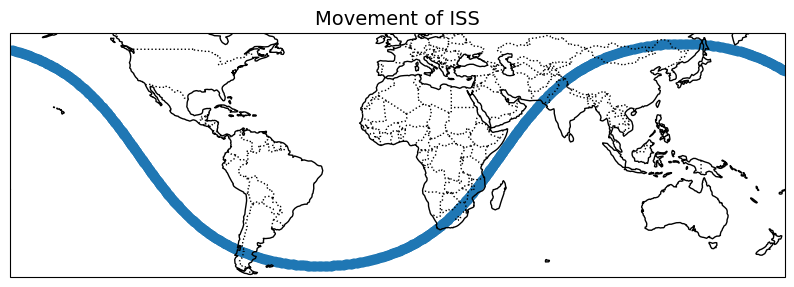

In [35]:
fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.PlateCarree()})
fig.set_size_inches(10, 10)
iss_gdf.plot(
    ax=ax
)
ax.add_feature(cartopy.feature.BORDERS, linestyle=':')
ax.coastlines()
plt.title('Movement of ISS', fontsize = 14);
plt.savefig("fig_iss_paths_no_countries")

#### Plot by country crossed using Cartopy

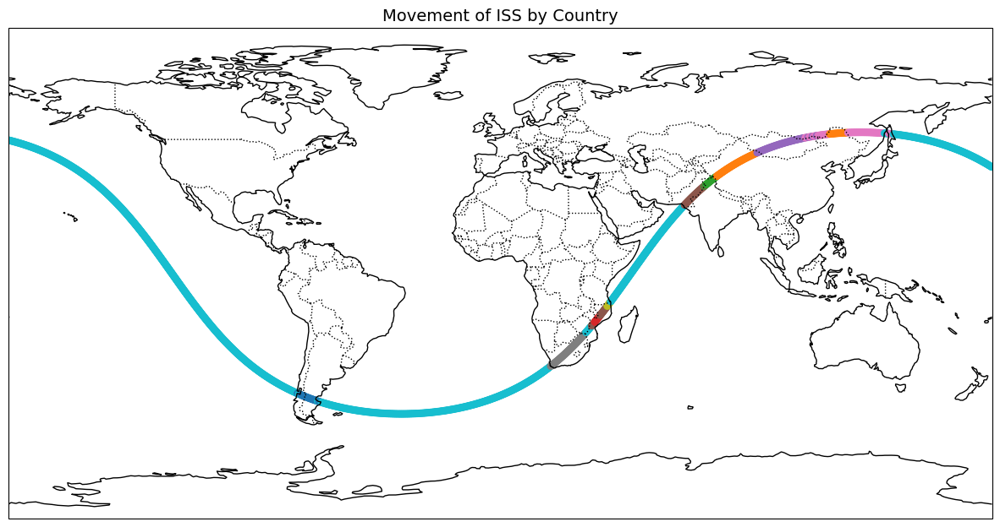

In [36]:
fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.PlateCarree()})
fig.set_size_inches(15, 10)
iss_gdf.plot(column="country", ax=ax, linewidth=0.5)

ax.add_feature(cartopy.feature.BORDERS, linestyle=':')
ax.coastlines()
ax.set_global()
plt.title('Movement of ISS by Country', fontsize = 14);

<GeoAxes: >

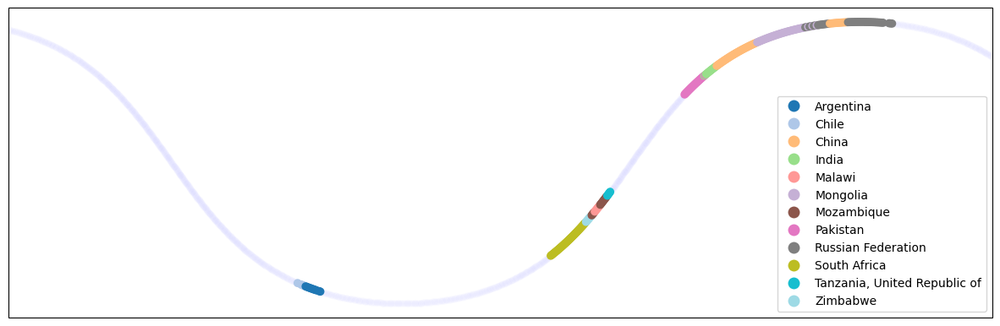

In [37]:
fig, ax = plt.subplots(1, 1, subplot_kw={'projection': ccrs.PlateCarree()})
fig.set_size_inches(15, 10)

iss_gdf_ocean.plot(ax=ax, color="blue", linewidth=0.05, alpha=0.015)
iss_gdf_land.plot(column="country",  ax=ax, cmap=mcm.get_cmap("tab20"), legend=True)

# ax.add_feature(cartopy.feature.BORDERS, linestyle=':')
# ax.coastlines()
# ax.set_global()
# plt.title('Movement of ISS by Country', fontsize = 14);

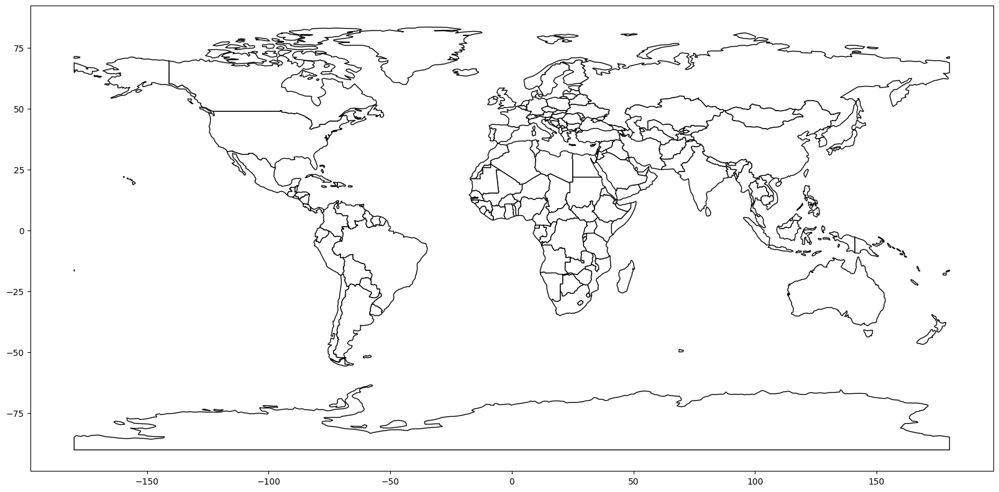

In [38]:
fig, ax = plt.subplots(1, figsize=(20,10))
base = gdf_world.plot(ax=ax, color='white', edgecolor='black',)

#### Map the globe and write the acronyms of overpassed countries

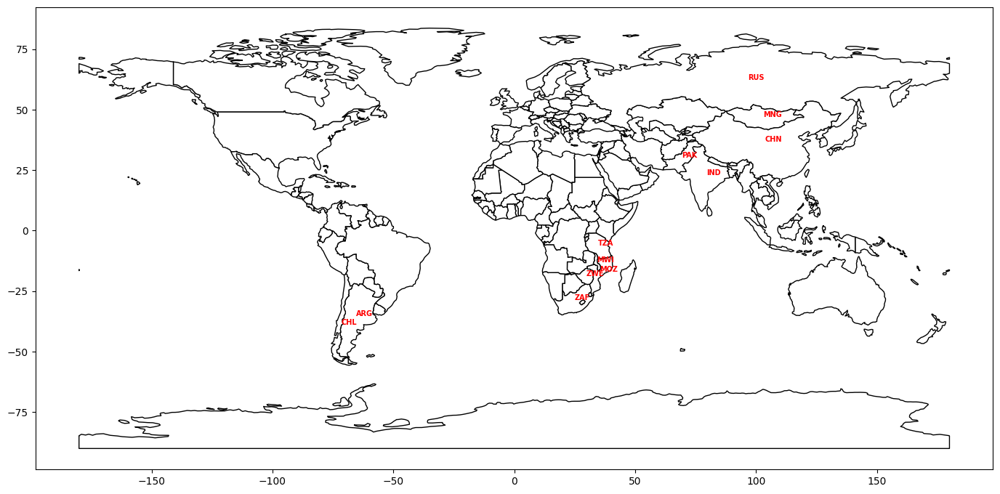

In [39]:
fig, ax = plt.subplots(1,1,figsize=(17,14))
base = gdf_world.plot(ax=ax, color='white', edgecolor='black',)
for x, y, label in zip(gdf_country_overpass.centroid.x, gdf_country_overpass.centroid.y, gdf_country_overpass.ISO_A3):
    base.annotate(label, xy=(x, y), xytext=(-0.25, 0.5),
                  color="red",
                  weight="bold",
                  size="7",
                  textcoords="offset points")

#### Map the globe, plot the paths and write the acronyms of overpassed countries

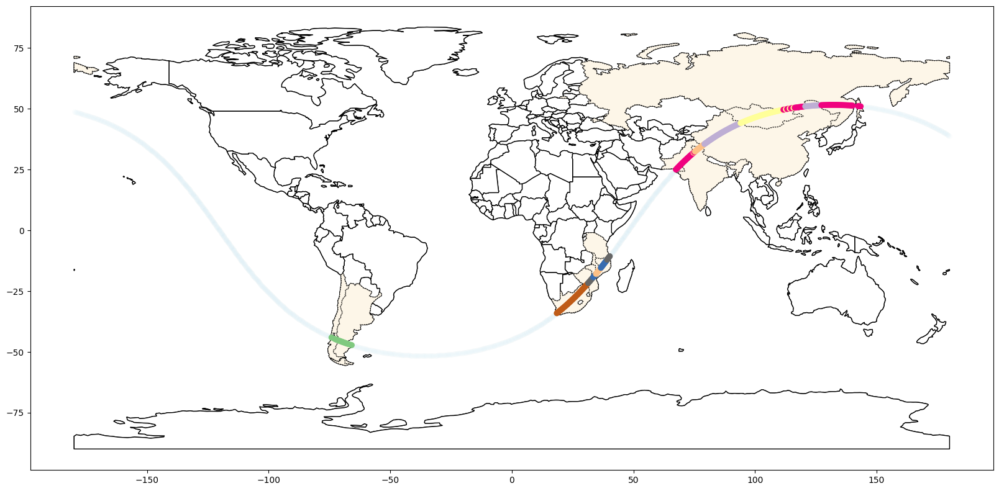

In [40]:
fig, ax = plt.subplots(1, figsize=(20,10))
base = gdf_world.plot(ax=ax, color='white', edgecolor='black',)
gdf_world.plot(ax=ax, color='white', edgecolor='black')
gdf_country_overpass.plot(color='oldlace', ax=ax, edgecolor='black', alpha=0.90, linestyle=':')

iss_gdf_ocean.plot(ax=ax, color="skyblue", linewidth=0.05, alpha=0.035)
iss_gdf_land.plot(column="country",  ax=ax, cmap=mcm.get_cmap("Accent"))

plt.savefig("fig_iss_paths_all_countries")

In [41]:
!ls

fig_iss_paths_all_countries.png  fig_iss_paths_no_countries.png  sample_data


In [42]:
#the blue box highlighted around the countries abbrievations
#for x, y, label in zip(gdf_country_overpass.centroid.x, gdf_country_overpass.centroid.y, gdf_country_overpass.ISO_A3):
#    base.annotate(label, xy=(x, y), xytext=(-0.25, 0.5),
#                  color="white",
#                  bbox=dict(boxstyle="square,pad=0",
#                      fc="blue", ec="blue", lw=2),
#                  weight="bold",
#                  size="7",
#                  textcoords="offset points");


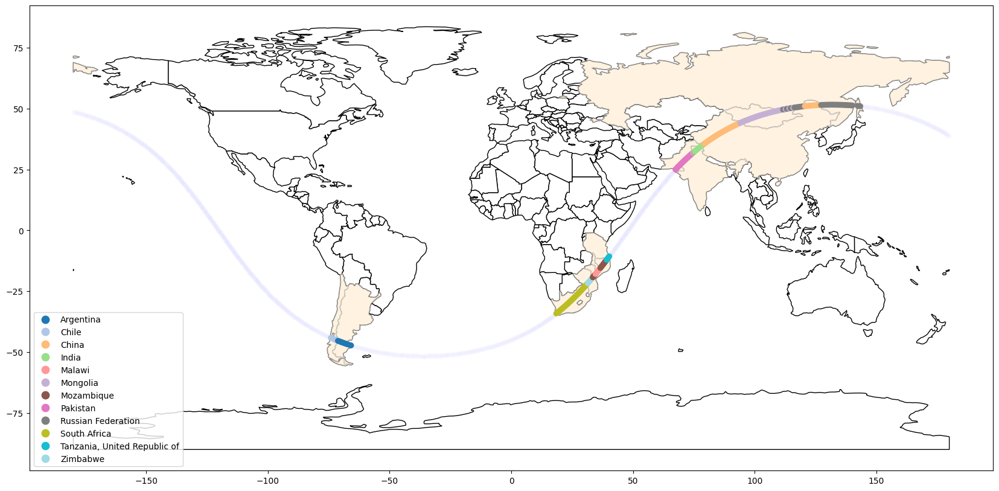

In [43]:
ig, ax = plt.subplots(1, figsize=(25,10))
base = gdf_world.plot(ax=ax, color='white', edgecolor='black',)
gdf_country_overpass.plot(color='#ffe4bd', ax=base, edgecolor='white', alpha=0.45)

iss_gdf_ocean.plot(ax=ax, color="blue", linewidth=0.05, alpha=0.015)
line1 = iss_gdf_land.plot(column="country",  ax=ax, cmap=mcm.get_cmap("tab20"), legend=True)

plt.savefig("fig_iss_paths_all_countries1")

In [44]:
pip install folium matplotlib mapclassify

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 2.1 MB/s eta 0:00:00


In [45]:
import folium

In [46]:
#ig, ax = plt.subplots(1, figsize=(25,10))
#base = gdf_world.plot(ax=ax, color='white', edgecolor='black',)
#gdf_country_overpass.plot(color='#ffe4bd', ax=base, edgecolor='white', alpha=0.45)

#iss_gdf_ocean.plot(ax=ax, color="blue", linewidth=0.05, alpha=0.015)
iss_gdf_ocean.explore(
    popup=False,
    color="blue"
)
#iss_gdf_land.explore(
#     column="country",  # make choropleth based on "BoroName" column
#     tooltip="country",  # show "BoroName" value in tooltip (on hover)
#     popup=True,  # show all values in popup (on click)
#     tiles="CartoDB positron",  # use "CartoDB positron" tiles
#     cmap=mcm.get_cmap("tab20"),  # use "Set1" matplotlib colormap
#     style_kwds=dict(color="black"),  # use black outline
# )
#iss_gdf_land.plot(column="country",  ax=ax, cmap=mcm.get_cmap("tab20"), legend=True)

#plt.savefig("fig_iss_paths_all_countries1")


In [47]:
import geopandas as gpd
import folium

gdf_world = gpd.read_file(url)

# assuming mask filters valid polygons for gdf_country_overpass
gdf_country_overpass = gdf_world[mask]

gdf_centroids = gdf_country_overpass.copy()
gdf_centroids["geometry"] = gdf_centroids.centroid

m = iss_gdf_land.explore(
    column="country",  # make choropleth based on "BoroName" column
    legend=True, #
    tooltip="country",  # show "BoroName" value in tooltip (on hover)
    popup=True,  # show all values in popup (on click)
    tiles="CartoDB positron",  # use "CartoDB positron" tiles
    cmap=mcm.get_cmap("tab20"),  # use "Set1" matplotlib colormap
    #style_kwds=dict(color="black"),  # use black outline
)

# add world GeoDataFrame layer
folium.GeoJson(
    gdf_world,
    style_function=lambda x: {"color": "black", "weight": 1, "fillOpacity": 0},
    name="World Borders"
).add_to(m)

# put the country overpass layer (make sure it's polygons)
folium.GeoJson(
    gdf_country_overpass,
    style_function=lambda x: {"color": "white", "fillColor": "#ffe4bd", "fillOpacity": 0.45},
    name="Country Overpass"
).add_to(m)

# need layer control
folium.LayerControl().add_to(m)

# save map
m.save("interactive_map_with_static.html")

m

In [48]:
# with oceans:

import geopandas as gpd
import folium

gdf_world = gpd.read_file(url)

# assuming mask filters valid polygons for gdf_country_overpass
gdf_country_overpass = gdf_world[mask]

gdf_centroids = gdf_country_overpass.copy()
gdf_centroids["geometry"] = gdf_centroids.centroid

m = iss_gdf_land.explore(
    column="country",
    legend=True,
    tooltip="country",
    popup=True,
    tiles="CartoDB positron",
    cmap=mcm.get_cmap("tab20"),
)

# make FeatureGroup for ocean data
fg1 = folium.FeatureGroup(name="ISS Ocean Path")

# add ocean features to fg1
iss_gdf_ocean.explore(
    m=m,  # add to the existing map
    popup=False,
    color="blue"
)

# add the feature group to the map
fg1.add_to(m)


# add world GeoDataFrame layer
folium.GeoJson(
    gdf_world,
    style_function=lambda x: {"color": "black", "weight": 1, "fillOpacity": 0},
    name="World Borders"
).add_to(m)

# put the country overpass layer (make sure it's polygons)
folium.GeoJson(
    gdf_country_overpass,
    style_function=lambda x: {"color": "white", "fillColor": "#ffe4bd", "fillOpacity": 0.45},
    name="Country Overpass"
).add_to(m)

# need layer control
folium.LayerControl().add_to(m)

# save map
m.save("interactive_map_with_static.html")

m

# testing out 3d interactive from https://colab.research.google.com/drive/1dIhM3FKsWCyrQgxDEbFuu2zDp8zcGk2c#scrollTo=Y-jkccTV0lRC

In [49]:
# (failed try because no globe)


#import pandas as pd
#import numpy as np
#import plotly.graph_objects as go
#import json
#import geopandas as gpd
import urllib.request, json
import plotly.graph_objects as go
from IPython.display import HTML


# get  Earth geometry data
url = "https://raw.githubusercontent.com/Nov05/playground-fireball/master/data/earth.json"
response = urllib.request.urlopen(url)
json_data = json.loads(response.read())

# get world data for country boundaries
gdf_world = gpd.read_file("https://raw.githubusercontent.com/datasets/geo-boundaries-world-110m/master/countries.geojson")

# ISS path data
iss_land_coords = [(lon, lat, country) for lon, lat, country in zip(iss_gdf_land.geometry.x, iss_gdf_land.geometry.y, iss_gdf_land['country'])]
iss_ocean_coords = [(lon, lat, "Ocean") for lon, lat in zip(iss_gdf_ocean.geometry.x, iss_gdf_ocean.geometry.y)]

# get earth's features
x0, y0, z0 = json_data['data'][0]['x'], json_data['data'][0]['y'], json_data['data'][0]['z']  # Parallels
x1, y1, z1 = json_data['data'][1]['x'], json_data['data'][1]['y'], json_data['data'][1]['z']  # Meridians
x3, y3, z3 = json_data['data'][3]['x'], json_data['data'][3]['y'], json_data['data'][3]['z']  # Land

# country boundaries into 3D coordinates
def project_to_sphere(lon, lat, radius=1):
    lon, lat = np.radians(lon), np.radians(lat)
    x = radius * np.cos(lat) * np.cos(lon)
    y = radius * np.cos(lat) * np.sin(lon)
    z = radius * np.sin(lat)
    return x, y, z

country_traces = []
for _, row in gdf_world.iterrows():
    if row.geometry.geom_type == "Polygon":
        lon, lat = row.geometry.exterior.xy
        x, y, z = project_to_sphere(lon, lat)
        country_traces.append(go.Scatter3d(x=x, y=y, z=z, mode='lines', line=dict(color='white', width=1), showlegend=False))

#  ISS paths to 3D
iss_land_x, iss_land_y, iss_land_z = zip(*[project_to_sphere(lon, lat) for lon, lat in iss_land_coords])
iss_ocean_x, iss_ocean_y, iss_ocean_z = zip(*[project_to_sphere(lon, lat) for lon, lat in iss_ocean_coords])

# trace
trace_iss_land = go.Scatter3d(x=iss_land_x, y=iss_land_y, z=iss_land_z, mode='lines', line=dict(color='red', width=2), name='ISS Land Path')
trace_iss_ocean = go.Scatter3d(x=iss_ocean_x, y=iss_ocean_y, z=iss_ocean_z, mode='lines', line=dict(color='blue', width=2), name='ISS Ocean Path')

# layout
layout = go.Layout(
    title='3D Interactive Earth with ISS Path',
    width=1000, height=800,
    scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False)
    )
)
fig = go.Figure(data=[trace_iss_land, trace_iss_ocean] + country_traces, layout=layout)
fig.show()

ValueError: too many values to unpack (expected 2)

In [51]:
iss_gdf_land.set_crs(4326, inplace=True)

,t,latitude,longitude,land_flag,temperature,windspeed,traj_id,country,geometry
1029,2024-03-03 12:21:47,-44.1342,-74.1533,True,14.3,12.2,1,Chile,POINT (-74.1533 -44.1342)
1032,2024-03-03 12:22:03,-44.6621,-72.9258,True,11.2,5.1,1,Chile,POINT (-72.9258 -44.6621)
1033,2024-03-03 12:22:09,-44.8347,-72.5114,True,8.8,9.0,1,Chile,POINT (-72.5114 -44.8347)
1034,2024-03-03 12:22:15,-45.0212,-72.0562,True,6.2,14.1,1,Chile,POINT (-72.0562 -45.0212)
1035,2024-03-03 12:22:20,-45.1904,-71.6363,True,13.4,20.2,1,Chile,POINT (-71.6363 -45.1904)
...,...,...,...,...,...,...,...,...,...
1615,2024-03-03 13:16:31,51.3565,139.5995,True,-18.8,7.3,1,Russian Federation,POINT (139.5995 51.3565)
1616,2024-03-03 13:16:36,51.3169,140.1432,True,-20.8,5.0,1,Russian Federation,POINT (140.1432 51.3169)
1620,2024-03-03 13:16:59,51.1264,142.3555,True,-19.7,4.8,1,Russian Federation,POINT (142.3555 51.1264)
1621,2024-03-03 13:17:04,51.0729,142.8933,True,-18.5,4.6,1,Russian Federation,POINT (142.8933 51.0729)


In [52]:
iss_gdf_land.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [53]:
iss_gdf_ocean.set_crs(4326, inplace=True)


,t,latitude,longitude,land_flag,temperature,windspeed,traj_id,country,geometry
653,2024-03-03 11:46:39,48.7047,-179.8172,False,2.8,44.7,1,ocean,POINT (-179.8172 48.7047)
654,2024-03-03 11:46:45,48.5716,-179.2900,False,3.2,41.4,1,ocean,POINT (-179.29 48.5716)
655,2024-03-03 11:46:51,48.4473,-178.8094,False,3.7,35.7,1,ocean,POINT (-178.8094 48.4473)
656,2024-03-03 11:46:56,48.3208,-178.3313,False,3.7,35.5,1,ocean,POINT (-178.3313 48.3208)
657,2024-03-03 11:47:02,48.1921,-177.8557,False,3.5,36.0,1,ocean,POINT (-177.8557 48.1921)
...,...,...,...,...,...,...,...,...,...
1699,2024-03-03 13:24:20,39.8013,178.4454,False,13.2,13.4,1,ocean,POINT (178.4454 39.8013)
1700,2024-03-03 13:24:26,39.5908,178.7957,False,13.6,14.9,1,ocean,POINT (178.7957 39.5908)
1701,2024-03-03 13:24:31,39.3793,179.1435,False,13.9,14.9,1,ocean,POINT (179.1435 39.3793)
1702,2024-03-03 13:24:37,39.1665,179.4892,False,14.3,17.9,1,ocean,POINT (179.4892 39.1665)


In [54]:
iss_gdf_ocean.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [55]:
#import pandas as pd
#import numpy as np
#import plotly.graph_objects as go
#import json
#import geopandas as gpd
#import urllib.request, json
#import plotly.graph_objects as go
#from IPython.display import HTML

# get Earth geometry data
url = "https://raw.githubusercontent.com/Nov05/playground-fireball/master/data/earth.json"
response = urllib.request.urlopen(url)
json_data = json.loads(response.read())

# get world data for country boundaries
gdf_world = gpd.read_file("https://raw.githubusercontent.com/datasets/geo-boundaries-world-110m/master/countries.geojson")

# ISS path data
iss_land_coords = [(lon, lat, country) for lon, lat, country in zip(iss_gdf_land.geometry.x, iss_gdf_land.geometry.y, iss_gdf_land['country'])]
iss_ocean_coords = [(lon, lat, "Ocean") for lon, lat in zip(iss_gdf_ocean.geometry.x, iss_gdf_ocean.geometry.y)]

# get Earth features
x0, y0, z0 = json_data['data'][0]['x'], json_data['data'][0]['y'], json_data['data'][0]['z']  # Parallels
x1, y1, z1 = json_data['data'][1]['x'], json_data['data'][1]['y'], json_data['data'][1]['z']  # Meridians
x2, y2, z2 = json_data['data'][2]['x'], json_data['data'][2]['y'], json_data['data'][2]['z']  # Base (dots)
x3, y3, z3 = json_data['data'][3]['x'], json_data['data'][3]['y'], json_data['data'][3]['z']  # Land

#  ISS paths to 3D
radius = 6400  # Slightly above Earth's surface
def project_to_sphere(lon, lat, radius=radius):
    lon, lat = np.radians(lon), np.radians(lat)
    x = radius * np.cos(lat) * np.cos(lon)
    y = radius * np.cos(lat) * np.sin(lon)
    z = radius * np.sin(lat)
    return x, y, z

iss_land_x, iss_land_y, iss_land_z, iss_land_text = zip(*[(
    *project_to_sphere(lon, lat), country) for lon, lat, country in iss_land_coords])
iss_ocean_x, iss_ocean_y, iss_ocean_z, iss_ocean_text = zip(*[(
    *project_to_sphere(lon, lat), "Ocean") for lon, lat, _ in iss_ocean_coords])

# traces
trace_parallels = go.Scatter3d(x=x0, y=y0, z=z0, mode='lines', line=dict(color='darkblue', width=1), showlegend=False)
trace_meridians = go.Scatter3d(x=x1, y=y1, z=z1, mode='lines', line=dict(color='darkblue', width=1), showlegend=False)
trace_base = go.Scatter3d(x=x2, y=y2, z=z2, mode='markers', marker=dict(size=2, color='darkblue', opacity=0.1), showlegend=False)
trace_land = go.Scatter3d(x=x3, y=y3, z=z3, mode='lines', line=dict(color='black', width=1), showlegend=False)
trace_iss_land = go.Scatter3d(
    x=iss_land_x, y=iss_land_y, z=iss_land_z, mode='lines',
    line=dict(color='orange', width=2), name='ISS Land Path',
    hoverinfo='text', text=iss_land_text)
trace_iss_ocean = go.Scatter3d(
    x=iss_ocean_x, y=iss_ocean_y, z=iss_ocean_z, mode='lines',
    line=dict(color='blue', width=2), name='ISS Ocean Path',
    hoverinfo='text', text=iss_ocean_text)
# layout
layout = go.Layout(
    title='3D Interactive Earth with ISS Path',
    width=1000, height=800,
    scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
        bgcolor='white'
    ),
    paper_bgcolor='white'
)
fig = go.Figure(data=[trace_parallels, trace_meridians, trace_base, trace_land, trace_iss_land, trace_iss_ocean], layout=layout)
fig.show()

In [56]:
%%writefile testing.csv
col1,col2,col3
1,2,3
4,5,6
2.0,4.0,5.2
-4,8,0

Writing testing.csv


In [57]:
!cat testing.csv


col1,col2,col3
1,2,3
4,5,6
2.0,4.0,5.2
-4,8,0


In [58]:
import pandas as pd


In [59]:
df=pd.read_csv("testing.csv")

In [60]:
df

,col1,col2,col3
0,1.0,2.0,3.0
1,4.0,5.0,6.0
2,2.0,4.0,5.2
3,-4.0,8.0,0.0


In [61]:
df.columns

Index(['col1', 'col2', 'col3'], dtype='object')

<Axes: xlabel='col2'>

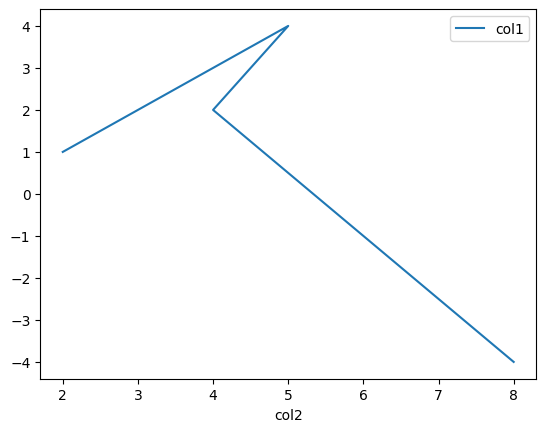

In [62]:
df.plot(x="col2", y="col1")

In [63]:
# dashboard

In [64]:
!pip install gradio pandas matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 58.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 3.8 MB/s eta 0:00:00


In [65]:
import gradio as gr
import pandas as pd
import matplotlib.pyplot as plt

# Function to process uploaded file and make a plot
def show_dashboard(file, column_x, column_y):
    df = pd.read_csv(file.name)

    # Create plot
    plt.figure(figsize=(8, 4))
    plt.plot(df[column_x], df[column_y], marker='o', linestyle='-')
    plt.xlabel(column_x)
    plt.ylabel(column_y)
    plt.title(f'{column_x} vs {column_y}')
    plt.grid(True)

    # Save plot to file and return
    plot_filename = "plot.png"
    plt.savefig(plot_filename)
    plt.close()
    return plot_filename

# Function to extract columns (needed for dropdowns)
def get_columns(file):
    df = pd.read_csv(file.name)
    columns = list(df.columns)
    return gr.update(choices=columns), gr.update(choices=columns)

# Gradio interface
with gr.Blocks() as dashboard:
    gr.Markdown("## 📊 Data Dashboard in Colab")
    file = gr.File(label="Upload CSV File")

    column_x = gr.Dropdown(label="Select X Column")
    column_y = gr.Dropdown(label="Select Y Column")

    file.change(get_columns, inputs=[file], outputs=[column_x, column_y])

    plot_output = gr.Image(label="Line Plot")
    submit_button = gr.Button("Generate Plot")

    submit_button.click(show_dashboard, inputs=[file, column_x, column_y], outputs=plot_output)

# Launch
dashboard.launch()


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://1220f161cba294606a.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [66]:
pip install streamlit matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 35.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 4.9 MB/s eta 0:00:00


In [67]:
lats=[2,60,43,55,3]
lons=[100,-45,60,30,-20]
df_iss=pd.DataFrame(dict(longitude=lons, latitude=lats))
df_iss

,longitude,latitude
0,100,2
1,-45,60
2,60,43
3,30,55
4,-20,3


In [68]:
def plot_df(df_iss):
    # Plot the points
    plt.figure(figsize=(6, 6))
    #plt.scatter(df['x'], df['y'], color='blue', s=100)
    plt.scatter(df_iss['longitude'], df_iss['latitude'], color='blue', s=100)
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.title('Scatter Plot of Input Coordinates')
    plt.grid(True)
    plt.show()

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# Sample CSV input field (users can paste CSV-like data)
csv_input = widgets.Textarea(
    value='1,2\n3,4\n5,6',
    placeholder='Enter x,y pairs separated by commas and new lines (e.g., 1,2)',
    description='Coordinates:',
    layout=widgets.Layout(width='500px', height='150px')
)

# Button to plot
button = widgets.Button(description="Plot Points")

# Output widget to hold the plot
output = widgets.Output()

# Function to parse input and plot
def on_button_click(b):
    with output:
        clear_output()  # Clear previous output/plot
        try:
            # Read the input into a pandas dataframe
            from io import StringIO
            df = pd.read_csv(StringIO(csv_input.value), header=None, names=['x', 'y'])

            # Plot the points
            #plt.figure(figsize=(6, 6))
            #plt.scatter(df['x'], df['y'], color='blue', s=100)
            #plt.scatter(df_iss['longitude'], df_iss['latitude'], color='blue', s=100)
            #plt.xlabel('X-axis')
            #plt.ylabel('Y-axis')
            #plt.title('Scatter Plot of Input Coordinates')
            #plt.grid(True)
            #plt.show()

            plot_df(df_iss)

            # Optionally show the table of coordinates
            display(df)
        except Exception as e:
            print("Error in input format. Please make sure to enter valid x,y pairs. Example:\n1,2\n3,4")
            print("Error details:", e)

# Connect button click event to function
button.on_click(on_button_click)

# Display widgets and output area
display(csv_input, button, output)


Textarea(value='1,2\n3,4\n5,6', description='Coordinates:', layout=Layout(height='150px', width='500px'), plac…

Button(description='Plot Points', style=ButtonStyle())

Output()

In [70]:
!pip install geopandas ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.8 MB/s eta 0:00:00


In [71]:
import geopandas as gpd
import pandas as pd
from ipywidgets import interact_manual, widgets, VBox, HBox
from IPython.display import display
import datetime
import folium

# my GeoDataFrame
subset_land = iss_gdf_land
subset_ocean = iss_gdf_ocean

min_time = iss_gdf_land['t'].min()
max_time = iss_gdf_land['t'].max()

# Widgets
start_date = widgets.DatePicker(description='Start Date', value=min_time.date())
start_time = widgets.Text(description='Start Time', value='00:00')  # HH:MM

end_date = widgets.DatePicker(description='End Date', value=max_time.date())
end_time = widgets.Text(description='End Time', value='23:59')  # HH:MM

filter_button = widgets.Button(description='Filter')
output = widgets.Output()

# Handler function
def on_filter_button_clicked(b):
    output.clear_output()
    try:
        start_dt_str = f"{start_date.value} {start_time.value}"
        end_dt_str = f"{end_date.value} {end_time.value}"

        start_dt = pd.to_datetime(start_dt_str)
        end_dt = pd.to_datetime(end_dt_str)

        if start_dt > end_dt:
            with output:
                print("⚠️ Start time must be before end time.")
            return

        subset_land = iss_gdf_land[(iss_gdf_land['t'] >= start_dt) & (iss_gdf_land['t'] <= end_dt)]
        subset_ocean = iss_gdf_ocean[(iss_gdf_ocean['t'] >= start_dt) & (iss_gdf_ocean['t'] <= end_dt)]

        with output:
            gdf_world = gpd.read_file("https://raw.githubusercontent.com/datasets/geo-boundaries-world-110m/master/countries.geojson")

            # assuming mask filters valid polygons for gdf_country_overpass
            gdf_country_overpass = gdf_world[mask]

            gdf_centroids = gdf_country_overpass.copy()
            gdf_centroids["geometry"] = gdf_centroids.centroid

            m = subset_land.explore(
                column="country",
                legend=True,
                tooltip="country",
                popup=True,
                tiles="CartoDB positron",
                cmap=mcm.get_cmap("tab20"),
            )

            # make FeatureGroup for ocean data
            fg1 = folium.FeatureGroup(name="ISS Ocean Path")

            # add ocean features to fg1
            subset_ocean.explore(
                m=m,  # add to the existing map
                popup=False,
                color="blue"
            )

            # add the feature group to the map
            fg1.add_to(m)


            # add world GeoDataFrame layer
            folium.GeoJson(
                gdf_world,
                style_function=lambda x: {"color": "black", "weight": 1, "fillOpacity": 0},
                name="World Borders"
            ).add_to(m)

            # put the country overpass layer (make sure it's polygons)
            folium.GeoJson(
                gdf_country_overpass,
                style_function=lambda x: {"color": "white", "fillColor": "#ffe4bd", "fillOpacity": 0.45},
                name="Country Overpass"
            ).add_to(m)

            # need layer control
            folium.LayerControl().add_to(m)

            # save map
            m.save("interactive_map_with_static.html")

            display(m)


    except Exception as e:
        with output:
            print("❌ Error parsing dates or filtering:", e)



# Link the button to the function
filter_button.on_click(on_filter_button_clicked)

# Display everything
display(VBox([
    HBox([start_date, start_time]),
    HBox([end_date, end_time]),
    filter_button,
    output
]))



In [ ]:
#Jules' graph

m = gdf_world.explore()

iss_gdf_land.explore(
    m=m,
    column="country",
    tiles="Pollutants around Cape Town",
    cmap="viridis_r",
    #style_kwds={"style_function":lambda x: {"radius":x["properties"]["Value"]}}
)

In [ ]:
iss_gdf_ocean[iss_gdf_ocean.land_flag==True]

In [ ]:
# print the countries abbrieviations that the orbit passes over
for x, y, label in zip(gdf_country_overpass.centroid.x, gdf_country_overpass.centroid.y, gdf_country_overpass.NAME):
    print(label)

In [ ]:
# putting the flags on the map as well, using pycountry and os

In [ ]:
! pip install matplotlib pillow
# import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
from io import BytesIO
import requests
# import os

In [ ]:
#using actual country names first

# get flag image from the internet
def get_flag_image(country_code):
    url = f"https://flagcdn.com/w40/{country_code.lower()}.png"  # Flagpedia's API
    response = requests.get(url)
    if response.status_code == 200:
        return Image.open(BytesIO(response.content))
    else:
        print(f"Flag not found for country code: {country_code}")
        return None

# List of countries and their ISO Alpha-2 codes
countries = {
    "Argentina": "AR",
    "Chile": "CL",
    "China": "CN",
    "India": "IN",
    "Malawi": "MW",
    "Mongolia": "MN",
    "Mozambique": "MZ",
    "Pakistan": "PK",
    "Russia": "RU",
    "South Africa": "ZA",
    "Tanzania": "TZ",
    "Zimbabwe": "ZW"
}


fig, ax = plt.subplots(figsize=(10, 5))
ax.set_title("ISS Path with Flags in Legend")
ax.axis("off")  # Turn off axes

# add flags to the legend
for i, (country, code) in enumerate(countries.items()):
    # get flag
    flag = get_flag_image(code)
    if flag:
        # Add flag to plot
        imagebox = OffsetImage(flag, zoom=0.5)
        ab = AnnotationBbox(imagebox, (0.1, 0.9 - i * 0.05), frameon=False)
        ax.add_artist(ab)
        # Add country name next to the flag
        ax.text(0.15, 0.9 - i * 0.05, country, fontsize=12, verticalalignment="center")

plt.show()


In [ ]:
!pip install pycountry
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerBase
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import requests
from io import BytesIO
import pycountry

In [ ]:
# not typing out each country's name:


# get a flag image from the internet
def get_flag_image(country_code):
    url = f"https://flagcdn.com/w40/{country_code.lower()}.png"  # Flagpedia's API
    response = requests.get(url)
    if response.status_code == 200:
        return Image.open(BytesIO(response.content))
    else:
        print("error")
        return None

# create the countries dictionary w/ ISO Alpha-3 codes
countries = {}
for code in gdf_country_overpass.ISO_A3:
    country = pycountry.countries.get(alpha_3=code)
    if country:
        countries[country.name] = country.alpha_2  # add country name & ISO Alpha-2 code

# plot map
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_title("ISS Path with Flags in Legend")
ax.axis("off")  # no axes

# Add flags to the legend
for i, (country, code) in enumerate(countries.items()):
    # get flag
    flag = get_flag_image(code)
    if i==0:
    #if flag:
        # Add flag to plot
        imagebox = OffsetImage(flag, zoom=1)
        ab = AnnotationBbox(imagebox, (0.1, 0.9 - i * 0.05), frameon=False)
        ax.add_artist(ab)
        # Add country name next to the flag
        ax.text(0.15, 0.9 - i * 0.05, country, fontsize=12, verticalalignment="center")

plt.show()

In [ ]:
# using an image as the flag's legend (becasue creating a legend doesnt work) and putting that in a seperate corner

import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
from io import BytesIO
import requests
import pycountry

def get_flag_image(country_code):
    url = f"https://flagcdn.com/w40/{country_code.lower()}.png"  # Flagpedia's API
    response = requests.get(url)
    if response.status_code == 200:
        try:
            img = Image.open(BytesIO(response.content))
            img.thumbnail((30, 20))  # Resize
            return img
        except Exception as e:
            print(f"Error processing image for {country_code}: {e}")
            return None
    else:
        print(f"Flag not found for country code: {country_code}")
        return None

countries = {}
for code in gdf_country_overpass.ISO_A3:
    country = pycountry.countries.get(alpha_3=code)
    if country:
        countries[country.name] = country.alpha_2

fig, ax = plt.subplots(1, figsize=(25, 10))
base = gdf_world.plot(ax=ax, color='white', edgecolor='black')
gdf_country_overpass.plot(color='#ffe4bd', ax=base, edgecolor='white', alpha=0.45)
iss_gdf_ocean.plot(ax=ax, color="blue", linewidth=0.05, alpha=0.015)
iss_gdf_land.plot(column="country", ax=ax, cmap=plt.cm.get_cmap("tab20"), legend=True)

flag_ax = fig.add_axes([0.75, 0.55, 0.2, 0.4])  # [left, bottom, width, height] in figure coordinates
flag_ax.axis("off")

for i, (country, code) in enumerate(countries.items()):
    flag = get_flag_image(code)
    if flag:
        # larger zoom
        imagebox = OffsetImage(flag, zoom=0.7)
        ab = AnnotationBbox(imagebox, (0.1, 0.9 - i * 0.055), frameon=False, xycoords="axes fraction")  #  spacing
        flag_ax.add_artist(ab)
        # country name next to the flag
        flag_ax.text(0.25, 0.9 - i * 0.055, country, fontsize=12, verticalalignment="center")  #  spacing

plt.savefig("fig_iss_paths_with_adjusted_spacing.png")
plt.show()

In [ ]:
!pip install flagpy
import flagpy as fp


In [ ]:
img = fp.get_flag_img("China")
plt.xticks([])
plt.yticks([])
plt.imshow(img)

In [ ]:
type(img)

In [ ]:
type(flag)

In [ ]:
# Renaming the countries to match with flagpy's country name spellings
def get_country_flag(country_name):
    name = country_name
    if "Russia" in name:
        name = "Russia"
    elif "Tanzania" in name:
        name = "Tanzania"
    # more ...
    flag = fp.get_flag_img(name)
    return flag

# sort the countries by name alphabetically
sorted_countries = sorted(zip(gdf_country_overpass.centroid.x,
                               gdf_country_overpass.centroid.y,
                               gdf_country_overpass.NAME),
                          key=lambda item: item[2])

# print the countries that the orbit passes over with their flags in alphabetical order
for x, y, label in sorted_countries:
    print(label)  # print the country name

In [ ]:
# renaming the countries to match with flagpy's country name spellings
def get_country_flag(country_name):
    name = country_name
    if "Russia" in name:
        name = "Russia"
    elif "Tanzania" in name:
        name = "Tanzania"
    # ...
    flag = fp.get_flag_img(name)
    return flag

# sort the countries and their coordinates alphabetically by country name
sorted_countries = sorted(zip(gdf_country_overpass.centroid.x,
                               gdf_country_overpass.centroid.y,
                               gdf_country_overpass.NAME),
                          key=lambda item: item[2])  # sort by the country name

# iterate over the sorted countries and show their flags
for x, y, label in sorted_countries:
    print(label)  # print country name
    flag = get_country_flag(label)  # get flag image for country
    plt.xticks([])  # remove x-axis ticks
    plt.yticks([])  # remove y-axis ticks
    plt.imshow(flag)
    plt.title(label)  # add country's name as title
    plt.show()


In [ ]:
# (best one)

from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# plot the map
fig, ax = plt.subplots(1, figsize=(25, 10))
base = gdf_world.plot(ax=ax, color='white', edgecolor='black')
gdf_country_overpass.plot(color='#ffe4bd', ax=base, edgecolor='white', alpha=0.45)
iss_gdf_ocean.plot(ax=ax, color="blue", linewidth=0.05, alpha=0.015)
line1 = iss_gdf_land.plot(column="country", ax=ax, cmap=mcm.get_cmap("tab20"), legend=True)

# sort countries alphabetically
sorted_countries = sorted(gdf_country_overpass.NAME)

# add country flags to the map near the legend
legend_x = 0.18  # horizontal position
start_y = 0.34    # starting vertical position
y_step = -0.03   # vertical spacing btwn flags

for i, label in enumerate(sorted_countries):  # iterate over sorted countries
    # get the flag image for the country
    flag = get_country_flag(label)
    if flag is not None:
        # make an OffsetImage
        img = OffsetImage(flag, zoom=0.15)  # change zoom level for image size
        # calculate  position for each flag
        y_position = start_y + i * y_step
        box = AnnotationBbox(img, (legend_x, y_position), frameon=False, xycoords='axes fraction')
        ax.add_artist(box)

plt.savefig("fig_iss_paths_with_flags_alphabetical")
plt.show()

In [ ]:
url_cities = "https://github.com/nvkelso/natural-earth-vector/raw/master/10m_cultural/ne_10m_populated_places.shp"
world_cities = gpd.read_file(url_cities)
world_cities.head()

In [ ]:
base = gdf_world.plot(color='white', linewidth=0.5, edgecolor='black', figsize=(25, 10))
world_cities.plot(ax=base, color='orange', markersize=3)
base.set_axis_off()

In [ ]:
gdf_orbit_buffer = gpd.GeoDataFrame(geometry=iss_gdf_land.buffer(1.5))
gdf_orbit_buffer

In [ ]:
gdf_orbit_buffer.plot()

In [ ]:
fig, ax = plt.subplots(figsize=(25, 10))
iss_gdf_land.plot(ax=ax, color="blue", alpha=1.0)
gdf_orbit_buffer.plot(ax=ax, color="pink", alpha=0.2);

In [ ]:
cities_orbit = gpd.sjoin(world_cities, gdf_orbit_buffer,  how='inner'
                        # how='inner', op='intersects'
                         )
cities_orbit

In [ ]:
cities_orbit.plot(figsize=(25,10), markersize=0.5)

In [ ]:
base = gdf_world.plot(color='white', linewidth=0.5, edgecolor='black', figsize=(25, 10))
iss_gdf_land.plot(ax=base, color="blue", linewidth=0.1, alpha=0.1)
cities_orbit.plot(ax=base, color='orange', markersize=0.5)
base.set_axis_off()


# Step 4: Manipulation with MovingPandas

#### Create the MovingPandas trajectories

Create a GeoDataFram by specifying the Coordinate Reference System (CRS)

In [ ]:
gdf_path = gpd.GeoDataFrame(df, crs={'init': 'epsg:4326'})

Create the MovingPandas trajectories

In [ ]:
iss_trajc = mpd.TrajectoryCollection(gdf_path,
                                 x = "longitude", y="latitude",
                                 traj_id_col="traj_id", t="t")

#### Quick plots

Simple plot with all the trajectories

In [ ]:
iss_trajc.plot(column='traj_id', figsize=(10,20));

Determine the number of trajectories

In [ ]:
num_trajs = len(iss_trajc.trajectories)
print(f"Number of trajectories: {num_trajs}")

Plot the individual trajectories

In [ ]:
colors = ["green", "red", "blue", "purple", "pink"]
fig, ax = plt.subplots(num_trajs, 1)
for i in range(num_trajs):
    iss_trajc.trajectories[i].plot(ax=ax[i], color=colors[i])

#### Include Weather Data

In [ ]:
fig, ax = plt.subplots(1, figsize=(20,10))
base = gdf_world.plot(ax=ax, color='white', edgecolor='black',)
iss_trajc.trajectories[0].plot(ax=base, legend="true", column="temperature", cmap='jet')

In [ ]:
fig, ax = plt.subplots(1, figsize=(20,10))
base = gdf_world.plot(ax=ax, color='white', edgecolor='black',)
iss_trajc.trajectories[1].plot(ax=base, legend="true", column="temperature", cmap='jet')

In [ ]:
iss_trajc.trajectories[1].df

In [ ]:
fig, ax = plt.subplots(1, figsize=(20,10))
base = gdf_world.plot(ax=ax, color='white', edgecolor='black',)
iss_trajc.trajectories[2].plot(ax=base, legend="true", column="temperature", cmap='jet')

#### Create interactive plots with weather data

In [ ]:
iss_trajc.trajectories[1].hvplot(c="windspeed",
                                 tiles="ESRI",
                                 cmap="jet")

In [ ]:
iss_trajc.trajectories[1].hvplot(x='easting', y='northing',
                                 c="temperature",
                                 hover_cols=['country', 'windspeed'],
                                 tiles="ESRI",
                                 cmap="Set1")

In [ ]:
my_traj = iss_trajc.trajectories[1]
country = my_traj.df[my_traj.df.land_flag==True].hvplot(c="windspeed", tiles=True, global_extent=True, cmap="jet")
nocountry = my_traj.df[my_traj.df.land_flag==False].hvplot(tiles=True, global_extent=True, color="yellow")
nocountry*country
nocountry

In [ ]:
gdf_path2 = gpd.GeoDataFrame(df[df.land_flag==True], crs={'init': 'epsg:4326'})
iss_trajc2 = mpd.TrajectoryCollection(gdf_path2,
                                 x = "longitude", y="latitude",
                                 traj_id_col="traj_id", t="t")

In [ ]:
iss_trajc2.plot(column='traj_id', figsize=(10,20));